- 201805025 Deniz TÜRKÖZ
- 201805026 Furkan GÜNDEL
- 201805035 Burak AYAN
- 201805075 Beyza ŞAHİN
- 201805093 Zahraa ALTEKREETI

pip install numpy torch torchvision pillow tqdm matplotlib

In [ ]:
import os
import random
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt
from torch.cuda.amp import GradScaler, autocast

# Set seed for reproducibility
seed = 47
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)

from google.colab import drive
# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!nvidia-smi

Sun Jun 30 13:15:26 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   46C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
# Custom Dataset class
class SegmentationDataset(Dataset):
    def __init__(self, dir, transform=None):
        self.dir = dir
        self.transform = transform
        self.images = sorted([f for f in os.listdir(dir) if f.endswith('.jpg')])
        self.masks = sorted([f for f in os.listdir(dir) if f.endswith('.png')])
        assert len(self.images) == len(self.masks), "Number of images and masks do not match"

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image_path = os.path.join(self.dir, self.images[idx])
        mask_path = os.path.join(self.dir, self.masks[idx])
        image = Image.open(image_path).convert("RGB")
        mask = Image.open(mask_path).convert("L")
        if self.transform:
            image = self.transform(image)
            mask = self.transform(mask)
        return image, mask

In [ ]:
# Image and mask transformations
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor()
])

# Load dataset
data_dirs = [
    '/content/drive/MyDrive/Colab/M1',
    '/content/drive/MyDrive/Colab/M2',
    '/content/drive/MyDrive/Colab/M3',
    '/content/drive/MyDrive/Colab/M4',
    '/content/drive/MyDrive/Colab/T1',
    '/content/drive/MyDrive/Colab/T2',
    '/content/drive/MyDrive/Colab/T3',
    '/content/drive/MyDrive/Colab/T4'
]

datasets = [SegmentationDataset(data_dir, transform=transform) for data_dir in data_dirs]
full_dataset = torch.utils.data.ConcatDataset(datasets)

# Split dataset into train and test sets
train_size = int(0.8 * len(full_dataset))
test_size = len(full_dataset) - train_size
train_dataset, test_dataset = random_split(full_dataset, [train_size, test_size], generator=torch.Generator().manual_seed(seed))

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

In [ ]:
# Define UNet model
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.double_conv(x)


class UNet(nn.Module):
    def __init__(self, n_channels=3, n_classes=1):
        super(UNet, self).__init__()
        self.in_conv = DoubleConv(n_channels, 32)
        self.down1 = nn.Sequential(nn.MaxPool2d(2), DoubleConv(32, 64))
        self.down2 = nn.Sequential(nn.MaxPool2d(2), DoubleConv(64, 128))
        self.down3 = nn.Sequential(nn.MaxPool2d(2), DoubleConv(128, 256))
        self.down4 = nn.Sequential(nn.MaxPool2d(2), DoubleConv(256, 512))
        self.up1 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.conv1 = DoubleConv(512, 256)
        self.up2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.conv2 = DoubleConv(256, 128)
        self.up3 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.conv3 = DoubleConv(128, 64)
        self.up4 = nn.ConvTranspose2d(64, 32, kernel_size=2, stride=2)
        self.conv4 = DoubleConv(64, 32)
        self.out_conv = nn.Conv2d(32, n_classes, kernel_size=1)

    def forward(self, x):
        x1 = self.in_conv(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)
        x = self.up1(x5)
        x = self.conv1(torch.cat([x, x4], dim=1))
        x = self.up2(x)
        x = self.conv2(torch.cat([x, x3], dim=1))
        x = self.up3(x)
        x = self.conv3(torch.cat([x, x2], dim=1))
        x = self.up4(x)
        x = self.conv4(torch.cat([x, x1], dim=1))
        x = self.out_conv(x)
        return x

In [ ]:
# IoU calculation
def iou(pred, target, threshold=0.5):
    pred = (pred > threshold).float()
    intersection = (pred * target).sum()
    union = pred.sum() + target.sum() - intersection
    iou = intersection / union
    return iou

# Model, optimizer, and loss function
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNet().to(device)
optimizer = optim.Adam(model.parameters(), lr=0.001)
criterion = nn.BCEWithLogitsLoss()
scaler = GradScaler()

In [ ]:
def predict_image(image_path, model, transform, device):
    image = Image.open(image_path).convert("RGB")
    image = transform(image).unsqueeze(0).to(device)

    with torch.no_grad():
        output = model(image)
        prediction = torch.sigmoid(output).squeeze(0).cpu().numpy()

    return prediction

In [ ]:
# Training function
def train(model, train_loader, criterion, optimizer, device):
    model.train()
    epoch_loss = 0
    for images, masks in tqdm(train_loader):
        images, masks = images.to(device), masks.to(device)
        optimizer.zero_grad()
        with autocast():
            outputs = model(images)
            loss = criterion(outputs, masks)
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        epoch_loss += loss.item()
    return epoch_loss / len(train_loader)

In [ ]:
# Evaluation function
def evaluate(model, test_loader, criterion, device):
    model.eval()
    epoch_loss = 0
    iou_score = 0
    with torch.no_grad():
        for images, masks in tqdm(test_loader):
            images, masks = images.to(device), masks.to(device)
            with autocast():
                outputs = model(images)
                loss = criterion(outputs, masks)
            epoch_loss += loss.item()
            iou_score += iou(torch.sigmoid(outputs), masks).item()
    return epoch_loss / len(test_loader), iou_score / len(test_loader)

In [ ]:
# Training loop
num_epochs = 100
train_losses = []
test_losses = []
iou_scores = []

best_iou = 0
best_model_path = "/content/drive/MyDrive/Colab/best_unet_model.pth"

for epoch in range(num_epochs):
    train_loss = train(model, train_loader, criterion, optimizer, device)
    test_loss, iou_score = evaluate(model, test_loader, criterion, device)
    train_losses.append(train_loss)
    test_losses.append(test_loss)
    iou_scores.append(iou_score)
    print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss}, Test Loss: {test_loss}, IoU: {iou_score}")

    # Save the model if it has the best IoU score
    if iou_score > best_iou:
        best_iou = iou_score
        torch.save(model.state_dict(), best_model_path)
        print(f"New best IoU score: {best_iou}")

# Save the final model
final_model_path = "/content/drive/MyDrive/Colab/final_unet_model.pth"
torch.save(model.state_dict(), final_model_path)
print(f"Final model saved to {final_model_path}")

100%|██████████| 5/5 [00:59<00:00, 11.90s/it]


Epoch 1/100, Train Loss: 0.3821838550269604, Test Loss: 0.04757440984249115, IoU: 0.9917630195617676
New best IoU score: 0.9917630195617676


100%|██████████| 5/5 [00:04<00:00,  1.24it/s]


Epoch 2/100, Train Loss: 0.05783536322414875, Test Loss: 0.0411457434296608, IoU: 0.9917630195617676


100%|██████████| 5/5 [00:04<00:00,  1.00it/s]


Epoch 3/100, Train Loss: 0.038057545013725755, Test Loss: 0.038245609402656554, IoU: 0.9917630195617676


100%|██████████| 5/5 [00:03<00:00,  1.27it/s]


Epoch 4/100, Train Loss: 0.03482852904126048, Test Loss: 0.036273209005594255, IoU: 0.9917630195617676


100%|██████████| 5/5 [00:03<00:00,  1.26it/s]


Epoch 5/100, Train Loss: 0.033940765913575886, Test Loss: 0.03499501645565033, IoU: 0.9917630195617676


100%|██████████| 5/5 [00:04<00:00,  1.05it/s]


Epoch 6/100, Train Loss: 0.032676171697676185, Test Loss: 0.03337676636874676, IoU: 0.9917630195617676


100%|██████████| 5/5 [00:04<00:00,  1.20it/s]


Epoch 7/100, Train Loss: 0.03175265723839402, Test Loss: 0.032659406587481496, IoU: 0.9917630195617676


100%|██████████| 5/5 [00:03<00:00,  1.26it/s]


Epoch 8/100, Train Loss: 0.030797247402369977, Test Loss: 0.032112530618906024, IoU: 0.9917630195617676


100%|██████████| 5/5 [00:04<00:00,  1.16it/s]


Epoch 9/100, Train Loss: 0.029955383855849504, Test Loss: 0.03100208193063736, IoU: 0.9917630195617676


100%|██████████| 5/5 [00:04<00:00,  1.08it/s]


Epoch 10/100, Train Loss: 0.028750382456928493, Test Loss: 0.03132600039243698, IoU: 0.9917835116386413
New best IoU score: 0.9917835116386413


100%|██████████| 5/5 [00:03<00:00,  1.27it/s]


Epoch 11/100, Train Loss: 0.028551672212779523, Test Loss: 0.029362531378865242, IoU: 0.991793155670166
New best IoU score: 0.991793155670166


100%|██████████| 5/5 [00:03<00:00,  1.28it/s]


Epoch 12/100, Train Loss: 0.027389518078416587, Test Loss: 0.028310011699795724, IoU: 0.9919203877449035
New best IoU score: 0.9919203877449035


100%|██████████| 5/5 [00:04<00:00,  1.02it/s]


Epoch 13/100, Train Loss: 0.026416958961635827, Test Loss: 0.027445709705352782, IoU: 0.9920536875724792
New best IoU score: 0.9920536875724792


100%|██████████| 5/5 [00:03<00:00,  1.26it/s]


Epoch 14/100, Train Loss: 0.02575624790042639, Test Loss: 0.02653163783252239, IoU: 0.9920663714408875
New best IoU score: 0.9920663714408875


100%|██████████| 5/5 [00:03<00:00,  1.27it/s]


Epoch 15/100, Train Loss: 0.024973531439900398, Test Loss: 0.025688436627388, IoU: 0.9924781560897827
New best IoU score: 0.9924781560897827


100%|██████████| 5/5 [00:04<00:00,  1.13it/s]


Epoch 16/100, Train Loss: 0.02378463577479124, Test Loss: 0.025528914481401443, IoU: 0.9925427913665772
New best IoU score: 0.9925427913665772


100%|██████████| 5/5 [00:04<00:00,  1.06it/s]


Epoch 17/100, Train Loss: 0.023205577116459607, Test Loss: 0.025717714428901674, IoU: 0.9926346898078918
New best IoU score: 0.9926346898078918


100%|██████████| 5/5 [00:03<00:00,  1.27it/s]


Epoch 18/100, Train Loss: 0.023030457459390162, Test Loss: 0.02416660413146019, IoU: 0.9931629180908204
New best IoU score: 0.9931629180908204


100%|██████████| 5/5 [00:03<00:00,  1.28it/s]


Epoch 19/100, Train Loss: 0.021845463383942842, Test Loss: 0.022971461340785027, IoU: 0.9934643626213073
New best IoU score: 0.9934643626213073


100%|██████████| 5/5 [00:04<00:00,  1.03it/s]


Epoch 20/100, Train Loss: 0.021808320842683315, Test Loss: 0.023275674507021903, IoU: 0.9935507774353027
New best IoU score: 0.9935507774353027


100%|██████████| 5/5 [00:04<00:00,  1.20it/s]


Epoch 21/100, Train Loss: 0.021108070854097605, Test Loss: 0.02353879027068615, IoU: 0.9929345965385437


100%|██████████| 5/5 [00:04<00:00,  1.24it/s]


Epoch 22/100, Train Loss: 0.02046044748276472, Test Loss: 0.022171320393681526, IoU: 0.9938335418701172
New best IoU score: 0.9938335418701172


100%|██████████| 5/5 [00:04<00:00,  1.16it/s]


Epoch 23/100, Train Loss: 0.019959242548793554, Test Loss: 0.02092551328241825, IoU: 0.994243609905243
New best IoU score: 0.994243609905243


100%|██████████| 5/5 [00:04<00:00,  1.03it/s]


Epoch 24/100, Train Loss: 0.0192085494287312, Test Loss: 0.02081015855073929, IoU: 0.9942901849746704
New best IoU score: 0.9942901849746704


100%|██████████| 5/5 [00:03<00:00,  1.27it/s]


Epoch 25/100, Train Loss: 0.017927951738238336, Test Loss: 0.01971561573445797, IoU: 0.9946702003479004
New best IoU score: 0.9946702003479004


100%|██████████| 5/5 [00:03<00:00,  1.26it/s]


Epoch 26/100, Train Loss: 0.017684087483212353, Test Loss: 0.019276023656129838, IoU: 0.9945324420928955


100%|██████████| 5/5 [00:04<00:00,  1.00it/s]


Epoch 27/100, Train Loss: 0.01747955712489784, Test Loss: 0.01905122958123684, IoU: 0.9945826888084411


100%|██████████| 5/5 [00:04<00:00,  1.14it/s]


Epoch 28/100, Train Loss: 0.01694198800250888, Test Loss: 0.018588123098015785, IoU: 0.9948970675468445
New best IoU score: 0.9948970675468445


100%|██████████| 5/5 [00:03<00:00,  1.27it/s]


Epoch 29/100, Train Loss: 0.016015135636553168, Test Loss: 0.018483059667050838, IoU: 0.9950349569320679
New best IoU score: 0.9950349569320679


100%|██████████| 5/5 [00:03<00:00,  1.27it/s]


Epoch 30/100, Train Loss: 0.016143398825079203, Test Loss: 0.017508347146213056, IoU: 0.9949026584625245


100%|██████████| 5/5 [00:04<00:00,  1.04it/s]


Epoch 31/100, Train Loss: 0.015060972468927503, Test Loss: 0.01778159271925688, IoU: 0.9949676871299744


100%|██████████| 5/5 [00:03<00:00,  1.26it/s]


Epoch 32/100, Train Loss: 0.015668963408097626, Test Loss: 0.019780328683555125, IoU: 0.9945688486099243


100%|██████████| 5/5 [00:03<00:00,  1.27it/s]


Epoch 33/100, Train Loss: 0.01572606721892953, Test Loss: 0.01757955029606819, IoU: 0.9948360085487366


100%|██████████| 5/5 [00:04<00:00,  1.17it/s]


Epoch 34/100, Train Loss: 0.014272457361221314, Test Loss: 0.018508924543857573, IoU: 0.9949090003967285


100%|██████████| 5/5 [00:04<00:00,  1.08it/s]


Epoch 35/100, Train Loss: 0.014355827402323485, Test Loss: 0.016570794209837914, IoU: 0.9950952053070068
New best IoU score: 0.9950952053070068


100%|██████████| 5/5 [00:03<00:00,  1.27it/s]


Epoch 36/100, Train Loss: 0.014483005879446864, Test Loss: 0.01684174928814173, IoU: 0.995108163356781
New best IoU score: 0.995108163356781


100%|██████████| 5/5 [00:03<00:00,  1.27it/s]


Epoch 37/100, Train Loss: 0.013824323005974293, Test Loss: 0.016353337466716765, IoU: 0.9950170516967773


100%|██████████| 5/5 [00:04<00:00,  1.04it/s]


Epoch 38/100, Train Loss: 0.013109116116538644, Test Loss: 0.014909849129617214, IoU: 0.995363712310791
New best IoU score: 0.995363712310791


100%|██████████| 5/5 [00:04<00:00,  1.23it/s]


Epoch 39/100, Train Loss: 0.012405633088201284, Test Loss: 0.015185525082051754, IoU: 0.9953809976577759
New best IoU score: 0.9953809976577759


100%|██████████| 5/5 [00:03<00:00,  1.28it/s]


Epoch 40/100, Train Loss: 0.012881094589829445, Test Loss: 0.016505556367337703, IoU: 0.9952887892723083


100%|██████████| 5/5 [00:04<00:00,  1.16it/s]


Epoch 41/100, Train Loss: 0.012130689946934581, Test Loss: 0.015309712290763855, IoU: 0.9954454064369201
New best IoU score: 0.9954454064369201


100%|██████████| 5/5 [00:04<00:00,  1.07it/s]


Epoch 42/100, Train Loss: 0.011605589278042316, Test Loss: 0.015017480403184891, IoU: 0.9954897284507751
New best IoU score: 0.9954897284507751


100%|██████████| 5/5 [00:04<00:00,  1.23it/s]


Epoch 43/100, Train Loss: 0.011490761255845427, Test Loss: 0.015223636850714683, IoU: 0.9953275442123413


100%|██████████| 5/5 [00:03<00:00,  1.28it/s]


Epoch 44/100, Train Loss: 0.012121089780703188, Test Loss: 0.014318035542964935, IoU: 0.9956640124320983
New best IoU score: 0.9956640124320983


100%|██████████| 5/5 [00:04<00:00,  1.04it/s]


Epoch 45/100, Train Loss: 0.011359337717294693, Test Loss: 0.013935811631381512, IoU: 0.9954495191574096


100%|██████████| 5/5 [00:04<00:00,  1.16it/s]


Epoch 46/100, Train Loss: 0.011215947987511753, Test Loss: 0.013923315703868866, IoU: 0.9956485033035278


100%|██████████| 5/5 [00:03<00:00,  1.27it/s]


Epoch 47/100, Train Loss: 0.010515346424654126, Test Loss: 0.01406847294420004, IoU: 0.9956184148788452


100%|██████████| 5/5 [00:04<00:00,  1.22it/s]


Epoch 48/100, Train Loss: 0.0105172258336097, Test Loss: 0.013889322988688946, IoU: 0.9956162929534912


100%|██████████| 5/5 [00:04<00:00,  1.02it/s]


Epoch 49/100, Train Loss: 0.01094924150966108, Test Loss: 0.014257694967091084, IoU: 0.9954465746879577


100%|██████████| 5/5 [00:04<00:00,  1.23it/s]


Epoch 50/100, Train Loss: 0.010676699224859476, Test Loss: 0.014870948530733586, IoU: 0.9956497430801392


100%|██████████| 5/5 [00:03<00:00,  1.26it/s]


Epoch 51/100, Train Loss: 0.010159633308649062, Test Loss: 0.013818916864693165, IoU: 0.9957638263702393
New best IoU score: 0.9957638263702393


100%|██████████| 5/5 [00:04<00:00,  1.11it/s]


Epoch 52/100, Train Loss: 0.00960788067895919, Test Loss: 0.013773358613252639, IoU: 0.995779550075531
New best IoU score: 0.995779550075531


100%|██████████| 5/5 [00:04<00:00,  1.08it/s]


Epoch 53/100, Train Loss: 0.009485739981755614, Test Loss: 0.013778938725590707, IoU: 0.9958394289016723
New best IoU score: 0.9958394289016723


100%|██████████| 5/5 [00:04<00:00,  1.24it/s]


Epoch 54/100, Train Loss: 0.009335584682412445, Test Loss: 0.013815345801413059, IoU: 0.9956416130065918


100%|██████████| 5/5 [00:03<00:00,  1.26it/s]


Epoch 55/100, Train Loss: 0.009580567199736833, Test Loss: 0.014092020131647587, IoU: 0.9958401322364807
New best IoU score: 0.9958401322364807


100%|██████████| 5/5 [00:04<00:00,  1.01it/s]


Epoch 56/100, Train Loss: 0.009961832640692591, Test Loss: 0.012776849418878555, IoU: 0.9958224296569824


100%|██████████| 5/5 [00:04<00:00,  1.22it/s]


Epoch 57/100, Train Loss: 0.009934522095136344, Test Loss: 0.013933131843805313, IoU: 0.9957646012306214


100%|██████████| 5/5 [00:03<00:00,  1.26it/s]


Epoch 58/100, Train Loss: 0.010257556522265076, Test Loss: 0.013265983201563358, IoU: 0.9955381274223327


100%|██████████| 5/5 [00:04<00:00,  1.16it/s]


Epoch 59/100, Train Loss: 0.009608738543465733, Test Loss: 0.013192243687808514, IoU: 0.9956713318824768


100%|██████████| 5/5 [00:04<00:00,  1.01it/s]


Epoch 60/100, Train Loss: 0.009309282968752086, Test Loss: 0.014118815772235394, IoU: 0.9957865118980408


100%|██████████| 5/5 [00:04<00:00,  1.23it/s]


Epoch 61/100, Train Loss: 0.008941770414821804, Test Loss: 0.013974869437515736, IoU: 0.9958341002464295


100%|██████████| 5/5 [00:04<00:00,  1.21it/s]


Epoch 62/100, Train Loss: 0.008772411616519094, Test Loss: 0.012019585631787778, IoU: 0.9959896087646485
New best IoU score: 0.9959896087646485


100%|██████████| 5/5 [00:04<00:00,  1.12it/s]


Epoch 63/100, Train Loss: 0.008605788601562381, Test Loss: 0.013651168160140514, IoU: 0.995746648311615


100%|██████████| 5/5 [00:04<00:00,  1.06it/s]


Epoch 64/100, Train Loss: 0.008706338400952519, Test Loss: 0.013574102893471718, IoU: 0.995763099193573


100%|██████████| 5/5 [00:04<00:00,  1.22it/s]


Epoch 65/100, Train Loss: 0.008462162944488228, Test Loss: 0.012642531655728817, IoU: 0.9958702802658081


100%|██████████| 5/5 [00:04<00:00,  1.23it/s]


Epoch 66/100, Train Loss: 0.008335226099006832, Test Loss: 0.01284473855048418, IoU: 0.9959591865539551


100%|██████████| 5/5 [00:04<00:00,  1.03it/s]


Epoch 67/100, Train Loss: 0.008236029208637774, Test Loss: 0.01301960963755846, IoU: 0.9958325624465942


100%|██████████| 5/5 [00:04<00:00,  1.14it/s]


Epoch 68/100, Train Loss: 0.008240145212039352, Test Loss: 0.012883564271032811, IoU: 0.9959632396697998


100%|██████████| 5/5 [00:03<00:00,  1.25it/s]


Epoch 69/100, Train Loss: 0.008403070969507098, Test Loss: 0.01218392290174961, IoU: 0.9960501194000244
New best IoU score: 0.9960501194000244


100%|██████████| 5/5 [00:04<00:00,  1.20it/s]


Epoch 70/100, Train Loss: 0.008296953281387687, Test Loss: 0.013799670338630676, IoU: 0.9959121942520142


100%|██████████| 5/5 [00:05<00:00,  1.09s/it]


Epoch 71/100, Train Loss: 0.008300297195091844, Test Loss: 0.014900644682347775, IoU: 0.9955014109611511


100%|██████████| 5/5 [00:05<00:00,  1.07s/it]


Epoch 72/100, Train Loss: 0.008944990835152567, Test Loss: 0.013391702249646188, IoU: 0.9958933472633362


100%|██████████| 5/5 [00:04<00:00,  1.23it/s]


Epoch 73/100, Train Loss: 0.008675511251203716, Test Loss: 0.012692955136299134, IoU: 0.9958470821380615


100%|██████████| 5/5 [00:04<00:00,  1.21it/s]


Epoch 74/100, Train Loss: 0.008285174984484911, Test Loss: 0.012284473702311515, IoU: 0.9960440993309021


100%|██████████| 5/5 [00:04<00:00,  1.15it/s]


Epoch 75/100, Train Loss: 0.00807591644115746, Test Loss: 0.01265724077820778, IoU: 0.9961037635803223
New best IoU score: 0.9961037635803223


100%|██████████| 5/5 [00:05<00:00,  1.00s/it]


Epoch 76/100, Train Loss: 0.00788939541671425, Test Loss: 0.013385172933340073, IoU: 0.9959422469139099


100%|██████████| 5/5 [00:04<00:00,  1.22it/s]


Epoch 77/100, Train Loss: 0.007852668664418161, Test Loss: 0.012669591419398784, IoU: 0.9959534764289856


100%|██████████| 5/5 [00:04<00:00,  1.23it/s]


Epoch 78/100, Train Loss: 0.0077445769216865305, Test Loss: 0.013280643336474895, IoU: 0.9959672808647155


100%|██████████| 5/5 [00:04<00:00,  1.19it/s]


Epoch 79/100, Train Loss: 0.007630748068913817, Test Loss: 0.013695339672267437, IoU: 0.9958609938621521


100%|██████████| 5/5 [00:04<00:00,  1.00it/s]


Epoch 80/100, Train Loss: 0.00795327196829021, Test Loss: 0.01554927472025156, IoU: 0.9958082795143127


100%|██████████| 5/5 [00:04<00:00,  1.24it/s]


Epoch 81/100, Train Loss: 0.008556094416417182, Test Loss: 0.013211354613304138, IoU: 0.9958984017372131


100%|██████████| 5/5 [00:04<00:00,  1.23it/s]


Epoch 82/100, Train Loss: 0.00797639754600823, Test Loss: 0.01411935593932867, IoU: 0.9957726001739502


100%|██████████| 5/5 [00:04<00:00,  1.20it/s]


Epoch 83/100, Train Loss: 0.00802294621244073, Test Loss: 0.014011398144066333, IoU: 0.9958730816841126


100%|██████████| 5/5 [00:04<00:00,  1.01it/s]


Epoch 84/100, Train Loss: 0.0077546156710013745, Test Loss: 0.013554505072534084, IoU: 0.9959805607795715


100%|██████████| 5/5 [00:04<00:00,  1.21it/s]


Epoch 85/100, Train Loss: 0.0079911615466699, Test Loss: 0.01258090753108263, IoU: 0.9959733843803406


100%|██████████| 5/5 [00:04<00:00,  1.22it/s]


Epoch 86/100, Train Loss: 0.010563102248124779, Test Loss: 0.014979381300508975, IoU: 0.9954821825027466


100%|██████████| 5/5 [00:04<00:00,  1.23it/s]


Epoch 87/100, Train Loss: 0.010236264485865832, Test Loss: 0.013047271966934204, IoU: 0.9956432223320008


100%|██████████| 5/5 [00:04<00:00,  1.03it/s]


Epoch 88/100, Train Loss: 0.009046807838603853, Test Loss: 0.01246347464621067, IoU: 0.9959246277809143


100%|██████████| 5/5 [00:03<00:00,  1.26it/s]


Epoch 89/100, Train Loss: 0.008394334162585438, Test Loss: 0.013364213146269321, IoU: 0.9958423018455506


100%|██████████| 5/5 [00:03<00:00,  1.26it/s]


Epoch 90/100, Train Loss: 0.007767054717987776, Test Loss: 0.012217890284955502, IoU: 0.9961141347885132
New best IoU score: 0.9961141347885132


100%|██████████| 5/5 [00:04<00:00,  1.16it/s]


Epoch 91/100, Train Loss: 0.008101492933928967, Test Loss: 0.012886369787156581, IoU: 0.9959642767906189


100%|██████████| 5/5 [00:04<00:00,  1.02it/s]


Epoch 92/100, Train Loss: 0.007874918775632978, Test Loss: 0.013307003304362297, IoU: 0.9960294246673584


100%|██████████| 5/5 [00:04<00:00,  1.24it/s]


Epoch 93/100, Train Loss: 0.007731781736947596, Test Loss: 0.012295696325600148, IoU: 0.9960376620292664


100%|██████████| 5/5 [00:04<00:00,  1.25it/s]


Epoch 94/100, Train Loss: 0.00738854929804802, Test Loss: 0.012097715958952903, IoU: 0.9961284399032593
New best IoU score: 0.9961284399032593


100%|██████████| 5/5 [00:04<00:00,  1.10it/s]


Epoch 95/100, Train Loss: 0.007123579550534487, Test Loss: 0.012686595506966113, IoU: 0.9960712552070617


100%|██████████| 5/5 [00:04<00:00,  1.09it/s]


Epoch 96/100, Train Loss: 0.007109120790846646, Test Loss: 0.012791871838271619, IoU: 0.9960338592529296


100%|██████████| 5/5 [00:04<00:00,  1.23it/s]


Epoch 97/100, Train Loss: 0.006996267545036972, Test Loss: 0.013226947374641895, IoU: 0.9960491418838501


100%|██████████| 5/5 [00:04<00:00,  1.24it/s]


Epoch 98/100, Train Loss: 0.006894311704672873, Test Loss: 0.014245860464870929, IoU: 0.9959980130195618


100%|██████████| 5/5 [00:04<00:00,  1.08it/s]


Epoch 99/100, Train Loss: 0.006849701725877821, Test Loss: 0.013685998506844044, IoU: 0.9960777997970581


100%|██████████| 5/5 [00:04<00:00,  1.02it/s]

Epoch 100/100, Train Loss: 0.0068673348054289814, Test Loss: 0.014010780304670335, IoU: 0.9960779070854187
Final model saved to /content/drive/MyDrive/Colab/final_unet_model.pth


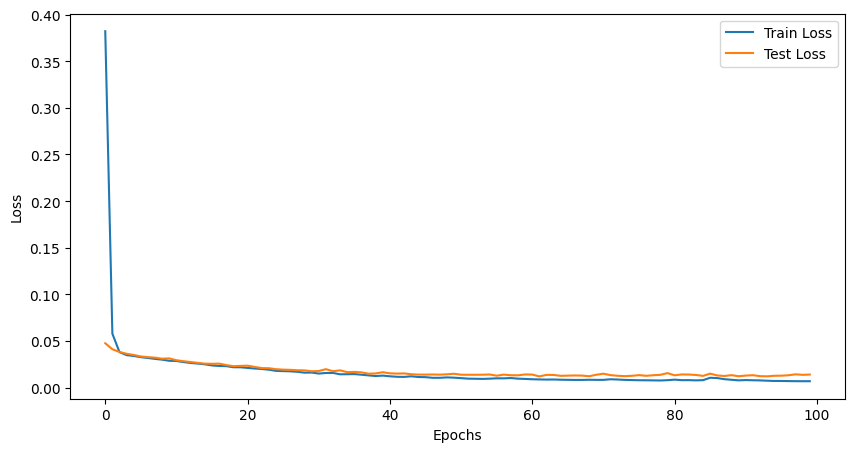

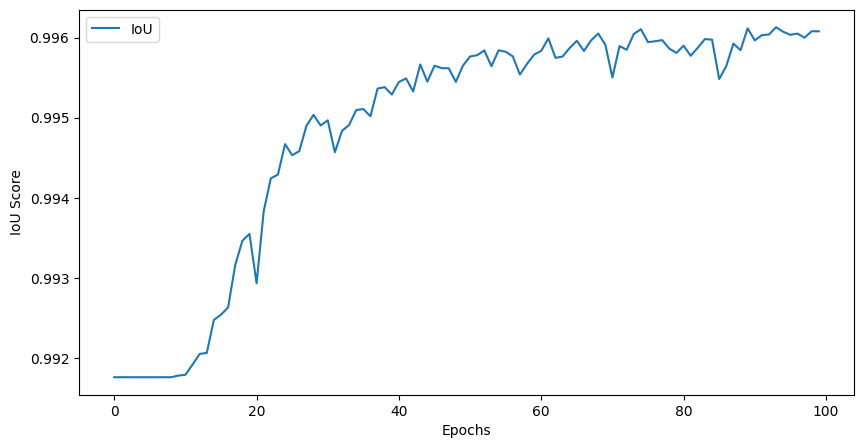

In [ ]:
# Plotting loss
plt.figure(figsize=(10,5))
plt.plot(train_losses, label="Train Loss")
plt.plot(test_losses, label="Test Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

# Plotting IoU score
plt.figure(figsize=(10,5))
plt.plot(iou_scores, label="IoU")
plt.xlabel("Epochs")
plt.ylabel("IoU Score")
plt.legend()
plt.show()

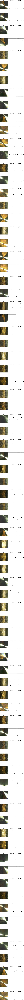

In [ ]:
# Function to visualize predictions for all test data
def visualize_all_predictions(model, data_loader, device):
    model.eval()
    images, masks, predictions = [], [], []

    with torch.no_grad():
        for images_batch, masks_batch in data_loader:
            images_batch, masks_batch = images_batch.to(device), masks_batch.to(device)
            with autocast():
                outputs = model(images_batch)
                preds_batch = torch.sigmoid(outputs)

            images.extend(images_batch.cpu())
            masks.extend(masks_batch.cpu())
            predictions.extend(preds_batch.cpu())

    num_images = len(images)
    fig, axs = plt.subplots(num_images, 3, figsize=(10, num_images * 5))
    for i in range(num_images):
        image_np = images[i].permute(1, 2, 0).numpy()
        mask_np = masks[i].squeeze().numpy()
        pred_np = predictions[i].squeeze().numpy()

        axs[i, 0].imshow(image_np)
        axs[i, 0].set_title("Input Image")
        axs[i, 0].axis('off')

        axs[i, 1].imshow(mask_np, cmap='gray')
        axs[i, 1].set_title("Ground Truth Mask")
        axs[i, 1].axis('off')

        axs[i, 2].imshow(pred_np, cmap='gray')
        axs[i, 2].set_title("Predicted Mask")
        axs[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

# Visualize all test data predictions
visualize_all_predictions(model, test_loader, device)

In [ ]:
# Save the final model
final_model_path = "/content/drive/MyDrive/Colab/final_unet_model.pth"
torch.save(model.state_dict(), final_model_path)
print(f"Final model saved to {final_model_path}")

Final model saved to /content/drive/MyDrive/Colab/final_unet_model.pth
